##### Purpose of the notebook ####

Run inferCNV on the CosMX data using the immune cells as a reference

In [1]:
import scanpy as sc
import infercnvpy as cnv
import matplotlib.pyplot as plt
import warnings
import os

/home/augusta/anaconda3/envs/scanpy_env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
SID = '242'

In [3]:
# Change working directory
import os
directory = f"/home/augusta/SSS_mount/insituCNV/InSituCNV/notebooks/CosMx/{SID}"
os.chdir(directory)

In [4]:
adata = sc.read_h5ad(f"/home/augusta/SSS_mount/insituCNV/data/WTx-CosMx_TVA/round2/{SID}/adata_{SID}_processed.h5ad")

In [5]:
adata

AnnData object with n_obs × n_vars = 451314 × 18545
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_local_px', 'CenterY_local_px', 'Width', 'Height', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD68_CK8_18', 'Max.CD68_CK8_18', 'Mean.CD298_B2M', 'Max.CD298_B2M', 'Mean.CD45', 'Max.CD45', 'Mean.DAPI', 'Max.DAPI', 'cell_id', 'Dash', 'ISH.concentration', 'Panel', 'Run_Tissue_name', 'Run_name', 'assay_type', 'dualfiles', 'tissue', 'version', 'slide_ID', 'CenterX_global_px', 'CenterY_global_px', 'cell_ID', 'unassignedTranscripts', 'median_RNA', 'RNA_quantile_0.75', 'RNA_quantile_0.8', 'RNA_quantile_0.85', 'RNA_quantile_0.9', 'RNA_quantile_0.95', 'RNA_quantile_0.99', 'nCount_RNA', 'nFeature_RNA', 'median_negprobes', 'negprobes_quantile_0.75', 'negprobes_quantile_0.8', 'negprobes_quantile_0.85', 'negprobes_quantile_0.9', 'negprobes_quantile_0.95', 'negprobes_quantile_0.99', 'nCount_negprobes', 'nFeature_negprobes', 'median_falsecode', 'falsecode_quantile_0.75', 'falsecode_quantile_0.8', 'falsecode_quantil

In [6]:
adata.layers['logcounts'] = adata.X.copy()

In [7]:
import sys

# Display the current system paths
sys.path

['/home/augusta/SSS_mount/insituCNV/InSituCNV/notebooks/CosMx/222',
 '/home/augusta/anaconda3/envs/scanpy_env/lib/python311.zip',
 '/home/augusta/anaconda3/envs/scanpy_env/lib/python3.11',
 '/home/augusta/anaconda3/envs/scanpy_env/lib/python3.11/lib-dynload',
 '',
 '/home/augusta/anaconda3/envs/scanpy_env/lib/python3.11/site-packages',
 '/home/augusta/anaconda3/envs/scanpy_env/lib/python3.11/site-packages/setuptools/_vendor']

In [8]:
sys.path.append("/home/augusta/SSS_mount/insituCNV/InSituCNV/modules")

# Moments to smoothen

In [20]:
import warnings
import numpy as np
from scipy.sparse import csr_matrix, issparse
from scvelo import logging as logg
from scvelo import settings
from scvelo.preprocessing.neighbors import get_connectivities, get_n_neighs, neighbors, verify_neighbors
from scvelo.preprocessing.utils import normalize_per_cell, not_yet_normalized


def moments(
    data,
    n_neighbors=30,
    n_pcs=None,
    mode="connectivities",
    method="umap",
    use_rep=None,
    use_highly_variable=True,
    copy=False,
):
    """Computes moments for velocity estimation.

    First-/second-order moments are computed for each cell across its nearest neighbors,
    where the neighbor graph is obtained from euclidean distances in PCA space.

    Arguments:
    ---------
    data: :class:`~anndata.AnnData`
        Annotated data matrix.
    n_neighbors: `int` (default: 30)
        Number of neighbors to use.
    n_pcs: `int` (default: None)
        Number of principal components to use.
        If not specified, the full space is used of a pre-computed PCA,
        or 30 components are used when PCA is computed internally.
    mode: `'connectivities'` or `'distances'`  (default: `'connectivities'`)
        Distance metric to use for moment computation.
    method : {{'umap', 'hnsw', 'sklearn', `None`}}  (default: `'umap'`)
        Method to compute neighbors, only differs in runtime.
        Connectivities are computed with adaptive kernel width as proposed in
        Haghverdi et al. 2016 (https://doi.org/10.1038/nmeth.3971).
    use_rep : `None`, `'X'` or any key for `.obsm` (default: None)
        Use the indicated representation. If `None`, the representation is chosen
        automatically: for .n_vars < 50, .X is used, otherwise ‘X_pca’ is used.
    use_highly_variable: `bool` (default: True)
        Whether to use highly variable genes only, stored in .var['highly_variable'].
    copy: `bool` (default: `False`)
        Return a copy instead of writing to adata.

    Returns
    -------
    Ms: `.layers`
        dense matrix with first order moments of spliced counts.
    Mu: `.layers`
        dense matrix with first order moments of unspliced counts.
    """
    adata = data.copy() if copy else data

    layers = [layer for layer in {"raw"} if layer in adata.layers]
    if any([not_yet_normalized(adata.layers[layer]) for layer in layers]):
        normalize_per_cell(adata)

    if n_neighbors is not None and n_neighbors > get_n_neighs(adata):
        warnings.warn(
            "Automatic neighbor calculation is deprecated since scvelo==0.4.0 and will be removed in a future version "
            "of scVelo. Please compute neighbors first with Scanpy.",
            DeprecationWarning,
            stacklevel=2,
        )
        neighbors(
            adata,
            n_neighbors=n_neighbors,
            use_rep=use_rep,
            use_highly_variable=use_highly_variable,
            n_pcs=n_pcs,
            method=method,
        )
    verify_neighbors(adata)

    if "spliced" not in adata.layers.keys() or "unspliced" not in adata.layers.keys():
        logg.info(f"computing moments based on {mode}", r=True)
        connectivities = get_connectivities(
            adata, mode, n_neighbors=n_neighbors, recurse_neighbors=False
        )
        adata.layers["Ms"] = (
            csr_matrix.dot(connectivities, csr_matrix(adata.layers["raw"]))
            .astype(np.float32)
            .toarray()
        )
    return adata if copy else None

AttributeError: module 'jax.interpreters.pxla' has no attribute 'ShardedDeviceArray'

In [24]:
import warnings
import numpy as np
from scipy.sparse import csr_matrix, issparse
from scvelo import logging as logg
from scvelo.preprocessing.neighbors import get_connectivities, get_n_neighs, neighbors, verify_neighbors
from scvelo.preprocessing.utils import normalize_per_cell, not_yet_normalized

In [28]:
def moments(
    data,
    n_neighbors=30,
    n_pcs=None,
    mode="connectivities",
    method="umap",
    use_rep=None,
    use_highly_variable=True,
    copy=False,
):
    """Computes smoothed values for gene expression.

    First-order moments are computed for each cell across its nearest neighbors,
    where the neighbor graph is obtained from euclidean distances in PCA space.

    Arguments:
    ---------
    data: :class:`~anndata.AnnData`
        Annotated data matrix.
    n_neighbors: `int` (default: 30)
        Number of neighbors to use.
    n_pcs: `int` (default: None)
        Number of principal components to use.
        If not specified, the full space is used of a pre-computed PCA,
        or 30 components are used when PCA is computed internally.
    mode: `'connectivities'` or `'distances'`  (default: `'connectivities'`)
        Distance metric to use for moment computation.
    method : {{'umap', 'hnsw', 'sklearn', `None`}}  (default: `'umap'`)
        Method to compute neighbors, only differs in runtime.
        Connectivities are computed with adaptive kernel width.
    use_rep : `None`, `'X'` or any key for `.obsm` (default: None)
        Use the indicated representation. If `None`, the representation is chosen
        automatically: for .n_vars < 50, .X is used, otherwise ‘X_pca’ is used.
    use_highly_variable: `bool` (default: True)
        Whether to use highly variable genes only, stored in .var['highly_variable'].
    copy: `bool` (default: `False`)
        Return a copy instead of writing to adata.

    Returns
    -------
    smoothed: `.layers`
        Dense matrix with smoothed expression values.
    """
    adata = data.copy() if copy else data

    # Ensure the data is normalized if not already done
    if not_yet_normalized(adata.X):
        normalize_per_cell(adata)

    # Compute neighbors if they haven't been calculated or if specified n_neighbors is greater
    if n_neighbors is not None and n_neighbors > get_n_neighs(adata):
        warnings.warn(
            "Automatic neighbor calculation is deprecated since scvelo==0.4.0 and will be removed in a future version "
            "of scVelo. Please compute neighbors first with Scanpy.",
            DeprecationWarning,
            stacklevel=2,
        )
        sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=n_pcs, use_rep=use_rep, method=method)


    verify_neighbors(adata)  # Check that neighbors are correctly set up

    logg.info(f"Computing smoothed values based on {mode}", r=True)

    # Get connectivities (neighbor weights)
    connectivities = get_connectivities(
        adata, mode, n_neighbors=n_neighbors, recurse_neighbors=False
    )

    # Compute smoothed values by multiplying connectivities with expression values
    expression_data = adata.layers["raw"] if "raw" in adata.layers else adata.X
    if issparse(expression_data):
        expression_data = expression_data.toarray()  # Convert to dense if sparse

    # Store smoothed values in a new layer
    adata.layers["smoothed"] = csr_matrix.dot(connectivities, csr_matrix(expression_data)).astype(np.float32)

    return adata if copy else None

In [29]:
# sc.pp.subsample(adata,0.1)

In [30]:
moments(adata, n_neighbors=30)

/tmp/ipykernel_1063093/1065681990.py:1: DeprecationWarning: Automatic neighbor calculation is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors first with Scanpy.
  moments(adata, n_neighbors=30)


Computing smoothed values based on connectivities


In [31]:
adata

AnnData object with n_obs × n_vars = 1221 × 18545
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_local_px', 'CenterY_local_px', 'Width', 'Height', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD68_CK8_18', 'Max.CD68_CK8_18', 'Mean.CD298_B2M', 'Max.CD298_B2M', 'Mean.CD45', 'Max.CD45', 'Mean.DAPI', 'Max.DAPI', 'cell_id', 'Dash', 'ISH.concentration', 'Panel', 'Run_Tissue_name', 'Run_name', 'assay_type', 'dualfiles', 'tissue', 'version', 'slide_ID', 'CenterX_global_px', 'CenterY_global_px', 'cell_ID', 'unassignedTranscripts', 'median_RNA', 'RNA_quantile_0.75', 'RNA_quantile_0.8', 'RNA_quantile_0.85', 'RNA_quantile_0.9', 'RNA_quantile_0.95', 'RNA_quantile_0.99', 'nCount_RNA', 'nFeature_RNA', 'median_negprobes', 'negprobes_quantile_0.75', 'negprobes_quantile_0.8', 'negprobes_quantile_0.85', 'negprobes_quantile_0.9', 'negprobes_quantile_0.95', 'negprobes_quantile_0.99', 'nCount_negprobes', 'nFeature_negprobes', 'median_falsecode', 'falsecode_quantile_0.75', 'falsecode_quantile_0.8', 'falsecode_quantile_

# Try the pipeline

In [9]:
adata.obs.ROI_status.unique()

['undefined', 'healthy']
Categories (2, object): ['healthy', 'undefined']

In [10]:
import infercnv_pipeline as ip

Running inferCNV with layer=logcounts, window_size=100, reference_key=ROI_status, reference_cat=['healthy']


100%|██████████████████████████████████████████████████████████████████████████████████████████| 91/91 [00:56<00:00,  1.62it/s]


Running PCA and computing neighbors...
Running CNV Leiden clustering with resolutions: [0.2]
Running Leiden clustering with resolution=0.2
Generating heatmap for groupby=cnv_leiden_res0.2, saving as _sample_242_logcounts_w100_ref-ROI_status-healthy_groupby-cnv_leiden_res0.2.png
categories: 0, 1, 2
var_group_labels: chr1, chr2, chr3, etc.


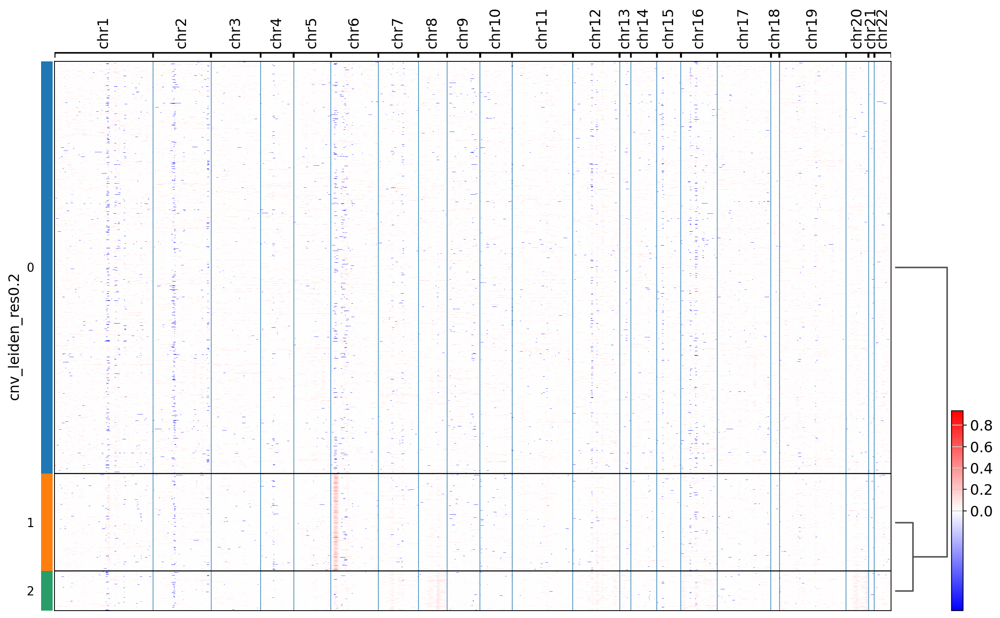

Generating spatial plot for groupby=cnv_leiden_res0.2, saving as _sample_242_logcounts_w100_ref-ROI_status-healthy_groupby-cnv_leiden_res0.2.png


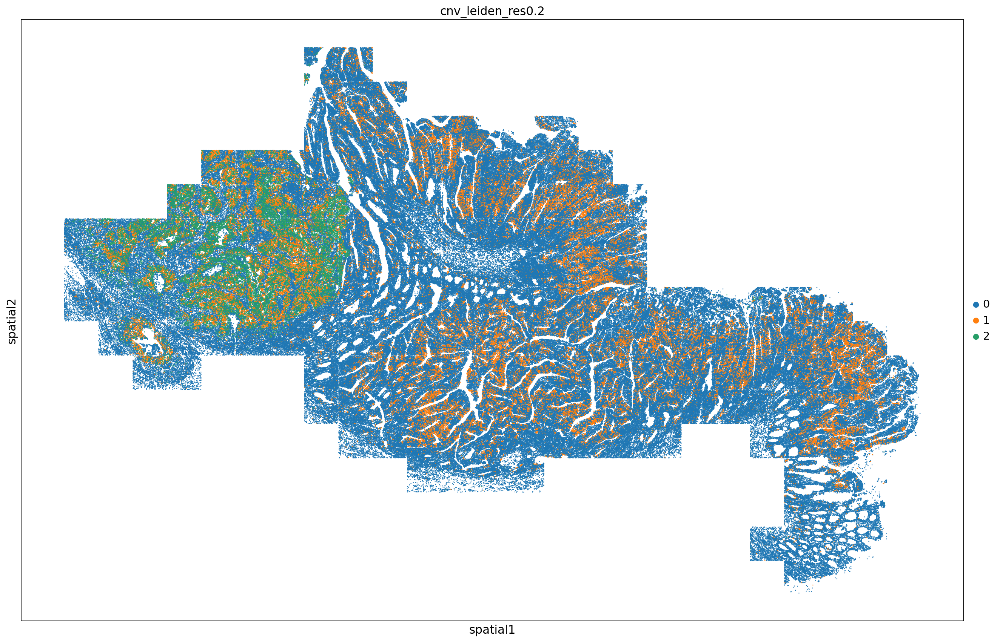

Pipeline complete.


In [24]:
ip.cnv_pipeline(adata, 
                sample_name=SID, 
                layer='logcounts',
                window_size=100, 
                reference_key='ROI_status', 
                reference_cat=['healthy'], 
                heatmap_groupby_list=[], # 'leiden', 'add_sub', 'ROI_status'
                cnv_leiden_resolutions=[0.2],
                spot_size = 120)

In [13]:
adata

AnnData object with n_obs × n_vars = 451314 × 18545
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_local_px', 'CenterY_local_px', 'Width', 'Height', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD68_CK8_18', 'Max.CD68_CK8_18', 'Mean.CD298_B2M', 'Max.CD298_B2M', 'Mean.CD45', 'Max.CD45', 'Mean.DAPI', 'Max.DAPI', 'cell_id', 'Dash', 'ISH.concentration', 'Panel', 'Run_Tissue_name', 'Run_name', 'assay_type', 'dualfiles', 'tissue', 'version', 'slide_ID', 'CenterX_global_px', 'CenterY_global_px', 'cell_ID', 'unassignedTranscripts', 'median_RNA', 'RNA_quantile_0.75', 'RNA_quantile_0.8', 'RNA_quantile_0.85', 'RNA_quantile_0.9', 'RNA_quantile_0.95', 'RNA_quantile_0.99', 'nCount_RNA', 'nFeature_RNA', 'median_negprobes', 'negprobes_quantile_0.75', 'negprobes_quantile_0.8', 'negprobes_quantile_0.85', 'negprobes_quantile_0.9', 'negprobes_quantile_0.95', 'negprobes_quantile_0.99', 'nCount_negprobes', 'nFeature_negprobes', 'median_falsecode', 'falsecode_quantile_0.75', 'falsecode_quantile_0.8', 'falsecode_quantil

In [14]:
adata.write(f"/home/augusta/SSS_mount/insituCNV/data/WTx-CosMx_TVA/round2/{SID}/adata_{SID}_processed_CNV.h5ad", compression='gzip')

In [15]:
adata_ep = adata[adata.obs['add_sub'].isin(['epi']), :].copy()

In [16]:
adata_ep

AnnData object with n_obs × n_vars = 302051 × 18545
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_local_px', 'CenterY_local_px', 'Width', 'Height', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD68_CK8_18', 'Max.CD68_CK8_18', 'Mean.CD298_B2M', 'Max.CD298_B2M', 'Mean.CD45', 'Max.CD45', 'Mean.DAPI', 'Max.DAPI', 'cell_id', 'Dash', 'ISH.concentration', 'Panel', 'Run_Tissue_name', 'Run_name', 'assay_type', 'dualfiles', 'tissue', 'version', 'slide_ID', 'CenterX_global_px', 'CenterY_global_px', 'cell_ID', 'unassignedTranscripts', 'median_RNA', 'RNA_quantile_0.75', 'RNA_quantile_0.8', 'RNA_quantile_0.85', 'RNA_quantile_0.9', 'RNA_quantile_0.95', 'RNA_quantile_0.99', 'nCount_RNA', 'nFeature_RNA', 'median_negprobes', 'negprobes_quantile_0.75', 'negprobes_quantile_0.8', 'negprobes_quantile_0.85', 'negprobes_quantile_0.9', 'negprobes_quantile_0.95', 'negprobes_quantile_0.99', 'nCount_negprobes', 'nFeature_negprobes', 'median_falsecode', 'falsecode_quantile_0.75', 'falsecode_quantile_0.8', 'falsecode_quantil

Generating heatmap for groupby=cnv_leiden_res0.2, saving as _show_sample_242_logcounts_w100_ref-ROI_status-healthy_groupby-cnv_leiden_res0.2_onlyepi.png
categories: 0, 1, 2
var_group_labels: chr1, chr2, chr3, etc.


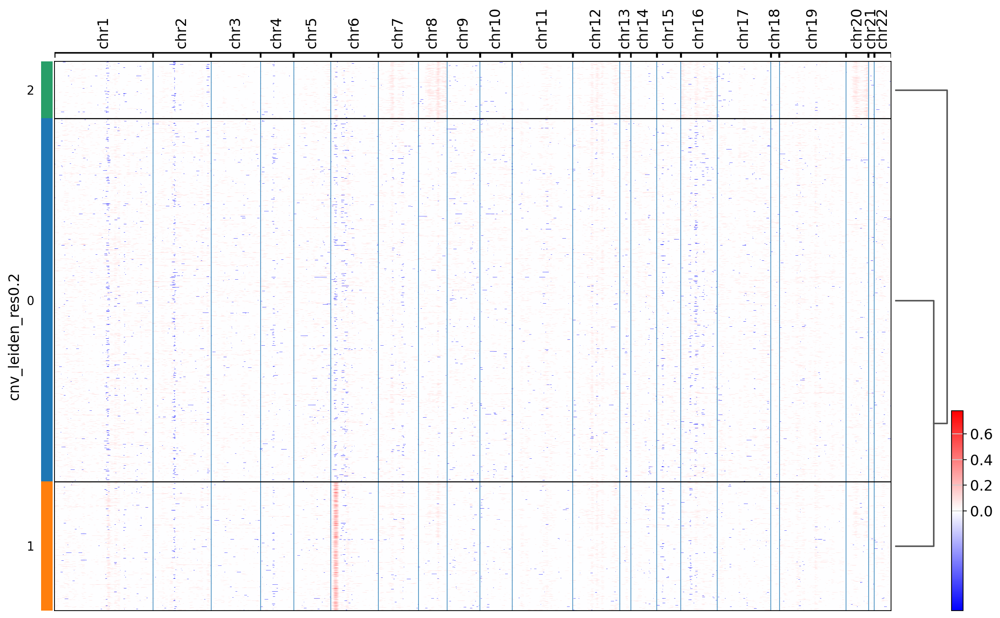

Generating spatial plot for groupby=cnv_leiden_res0.2, saving as _show_sample_242_logcounts_w100_ref-ROI_status-healthy_groupby-cnv_leiden_res0.2_onlyepi.png


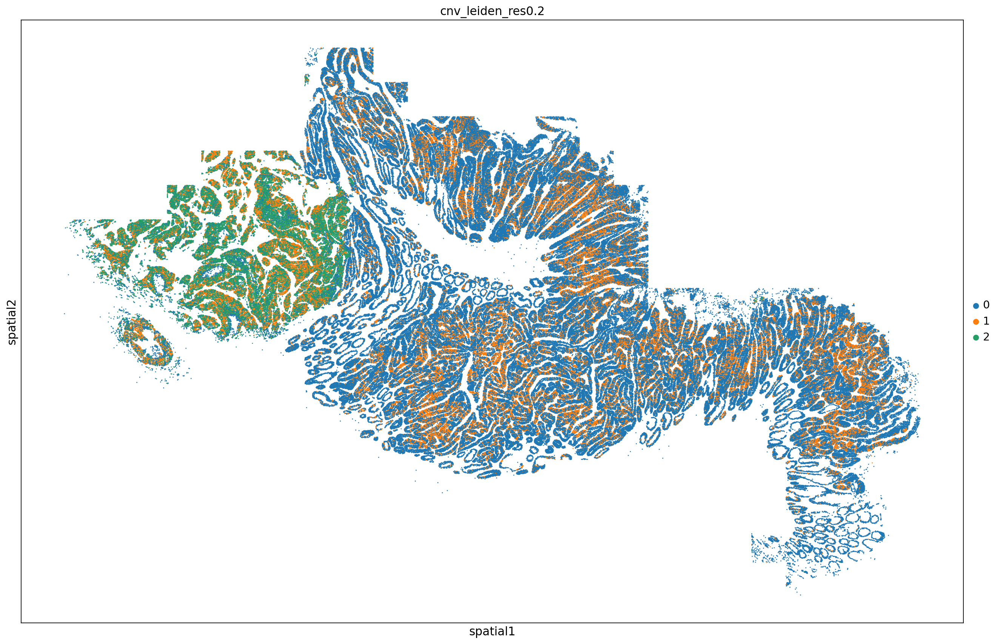

In [17]:
heatmap_groupby=['cnv_leiden_res0.2']

for groupby in heatmap_groupby:
    save_name = f'_show_sample_{SID}_logcounts_w100_ref-ROI_status-healthy_groupby-{groupby}_onlyepi.png'
    ip.step3_heatmap(adata_ep, heatmap_groupby=groupby, save_heatmap=save_name)
    ip.step4_spatialplot(adata_ep, spot_size=130, heatmap_groupby=groupby, save_spatialplot=save_name)

In [18]:
adata_ep.write(f"/home/augusta/SSS_mount/insituCNV/data/WTx-CosMx_TVA/round2/{SID}/adata_{SID}_processed_CNV_onlyepi.h5ad", compression='gzip')

In [21]:
adata

AnnData object with n_obs × n_vars = 451314 × 18545
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_local_px', 'CenterY_local_px', 'Width', 'Height', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD68_CK8_18', 'Max.CD68_CK8_18', 'Mean.CD298_B2M', 'Max.CD298_B2M', 'Mean.CD45', 'Max.CD45', 'Mean.DAPI', 'Max.DAPI', 'cell_id', 'Dash', 'ISH.concentration', 'Panel', 'Run_Tissue_name', 'Run_name', 'assay_type', 'dualfiles', 'tissue', 'version', 'slide_ID', 'CenterX_global_px', 'CenterY_global_px', 'cell_ID', 'unassignedTranscripts', 'median_RNA', 'RNA_quantile_0.75', 'RNA_quantile_0.8', 'RNA_quantile_0.85', 'RNA_quantile_0.9', 'RNA_quantile_0.95', 'RNA_quantile_0.99', 'nCount_RNA', 'nFeature_RNA', 'median_negprobes', 'negprobes_quantile_0.75', 'negprobes_quantile_0.8', 'negprobes_quantile_0.85', 'negprobes_quantile_0.9', 'negprobes_quantile_0.95', 'negprobes_quantile_0.99', 'nCount_negprobes', 'nFeature_negprobes', 'median_falsecode', 'falsecode_quantile_0.75', 'falsecode_quantile_0.8', 'falsecode_quantil

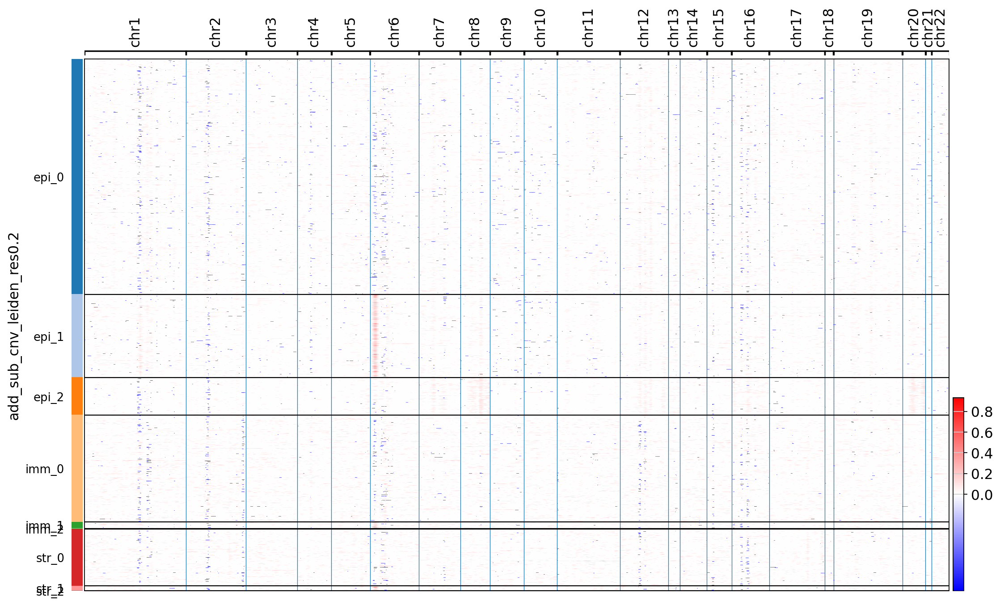

In [25]:
cnv.pl.chromosome_heatmap(adata, groupby=['add_sub', 'cnv_leiden_res0.2'])

/home/augusta/anaconda3/envs/scanpy_env/lib/python3.11/site-packages/anndata/_core/storage.py:85: ImplicitModificationWarning: X should not be a np.matrix, use np.ndarray instead.
  warnings.warn(msg, ImplicitModificationWarning)
... storing 'cnv_leiden_res0.2' as categorical


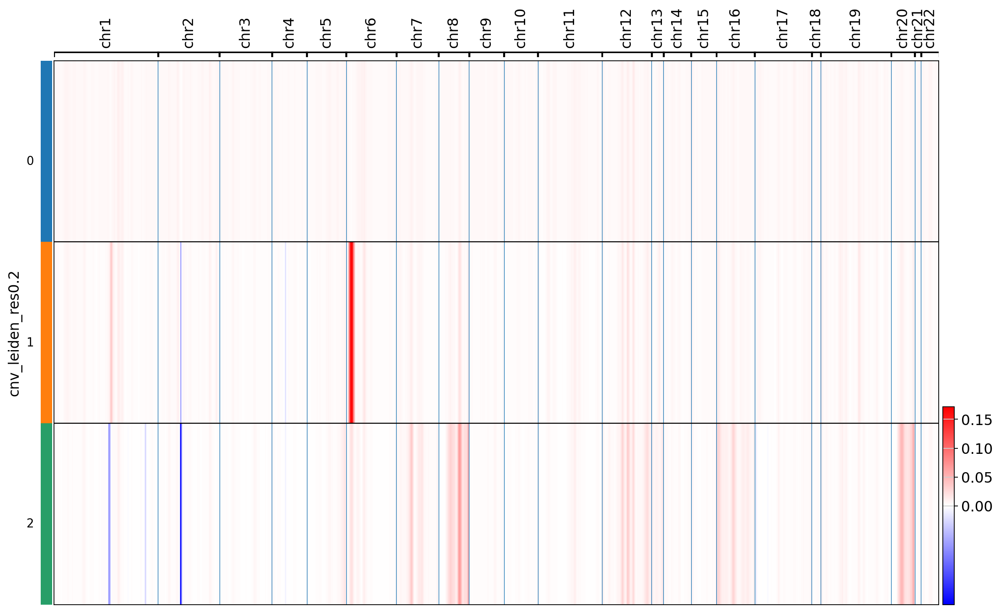

In [26]:
cnv.pl.chromosome_heatmap_summary(adata, groupby='cnv_leiden_res0.2')

In [23]:
adata.obs['cnv_leiden_res0.2']

c_4_34_1        0
c_4_34_2        0
c_4_34_3        0
c_4_34_4        0
c_4_34_5        0
               ..
c_4_221_1852    0
c_4_221_1854    0
c_4_221_1855    0
c_4_221_1856    0
c_4_221_1857    0
Name: cnv_leiden_res0.2, Length: 451314, dtype: category
Categories (2, object): ['0', '1']